# IMPORTS:



In [ ]:
import matplotlib.pyplot as plt

import numpy as np

import pandas as pd

import cv2,glob, re

from keras.layers import Input, Dropout, Flatten, Convolution2D, MaxPooling2D, Dense, Activation

import matplotlib.image as mpimg

from sklearn.model_selection import train_test_split

from sklearn.metrics import accuracy_score, precision_score, f1_score, recall_score

import tensorflow as tf

from tensorflow.keras import datasets, layers, models, optimizers

from sklearn.metrics import classification_report

from tensorflow import keras

from keras.models import Model

from keras.applications.resnet50 import ResNet50

import sklearn.metrics as metrics

from keras.callbacks import ModelCheckpoint

from google.colab import files

from google.colab import drive

import torch

from torchvision import transforms

from PIL import Image

import warnings
warnings.filterwarnings("ignore")

%pylab inline
%matplotlib inline

Populating the interactive namespace from numpy and matplotlib


# IMPORT CSV FROM PC

In [ ]:
uploaded = files.upload()

Saving annotations.csv to annotations.csv


#IMPORT PHOTOS FROM MY DRIVE

In [ ]:
drive.mount('/content/drive')

Mounted at /content/drive


# LOAD ANNOTATIONS FILE

In [ ]:
df = pd.read_csv('annotations.csv', delimiter = ",",header=0)

# Removing the not human attributes
df = df.drop(df[df.not_human == 1].index)
df.head()

,image,wrinkles,freckles,glasses,hair_color,hair_top,not_human
0,33.jpg,0,0,1,8,3,0
1,172.jpg,1,0,0,8,3,0
2,265.jpg,1,0,0,2,1,0
3,370.jpg,1,0,1,2,1,0
4,390.jpg,1,0,0,3,2,0


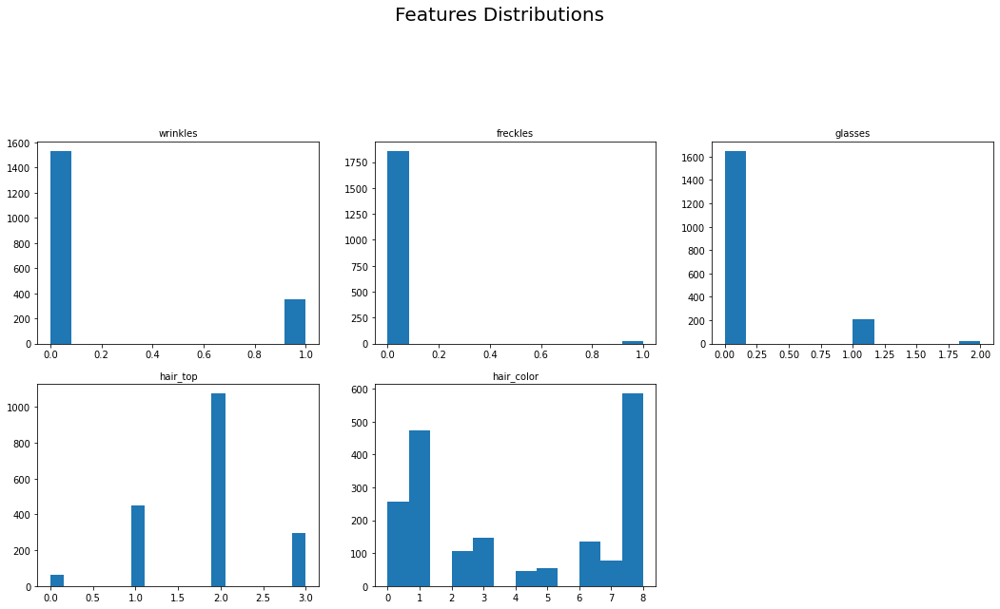

In [ ]:
# Checking Features Frequency
fig = plt.figure(figsize=(18, 18))
fig.suptitle('Features Distributions',fontsize=20, position=(0.5, 0.99))
selected = ['wrinkles','freckles','glasses','hair_top','hair_color']
counter = 1
for name in selected:
    sub = fig.add_subplot(4, 3, counter)
    sub.set_title( name, fontsize=10)
    plt.hist(df[name], bins='auto')  # arguments are passed to np.histogram
    counter += 1
plt.show()

#SORTING, AUGMENTING AND SAVING IMAGES
---
##### In this section the images count is increased for most of the features since the distribution is not equal among all of them.
##### df1: Original labels
##### df2: Wrinkles labels used for Wrinkles CNN
##### df3: Freckles labels used for Freckles CNN
##### df4: Glasses labels used for Glasses CNN
##### df5: Hair Top labels used for Hair Top CNN
##### df6: Hair Color labels used for Hair Color CNN
#########################################
##### original_images: Original images
##### wrinkles_images: Wrinkles images used for Wrinkles CNN
##### freckles_images: Freckles images used for Freckles CNN
##### glasses_images: Glasses images used for Glasses CNN
##### hair_top_images: Hair Top images used for Hair Top CNN
##### hair_color_images: Hair Color images used for Hair Color CNN



In [ ]:
digits = re.compile(r'(\d+)')
_nsre = re.compile('([0-9]+)')

def natural_sort_key(s):
    return [int(text) if text.isdigit() else text.lower()
            for text in re.split(_nsre, s)] 

items = sorted(glob.glob('/content/drive/MyDrive/photos/*'))
items.sort(key=natural_sort_key)

original_images = []
wrinkles_images = []
freckles_images = []
glasses_images = []
hair_images = []
hair_colors_images = []

df1 = pd.DataFrame()
df2 = pd.DataFrame()
df3 = pd.DataFrame()
df4 = pd.DataFrame()
df5 = pd.DataFrame()
df6 = pd.DataFrame()

loader_transform = transforms.RandomRotation(30)

for each_image in items:
    if each_image.endswith(".jpg") or each_image.endswith(".jpeg") or each_image.endswith(".JPG") or each_image.endswith(".JPEG"):
      name = each_image.split('/')
      myname = name[5]

      # Removing the not human images
      if str(myname) in df['image'].values :
        image = cv2.imread(each_image)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        image = cv2.resize(image, (128,128))

        image2 = loader_transform(Image.fromarray(image, 'RGB'))

        # Original Images
        original_images.append(image)
        # original_images.append(numpy.asarray(image2))
        # df1 = df1.append(df.loc[df['image']==myname])
        df1 = df1.append(df.loc[df['image']==myname])

        # Creating extra images due to the lack of wrinkles images
        wrinkles_images.append(image)
        df2 = df2.append(df.loc[df['image']==myname])

        wri = (df2.loc[df2['image'] == myname]['wrinkles'] == 1).to_string(index = False) 
        wri = wri.strip()
        if wri == 'True':
          df2 = df2.append(df2.loc[df2['image']==myname])
          df2 = df2.append(df.loc[df['image']==myname])

          wrinkles_images.append(image)
          wrinkles_images.append(numpy.asarray(image2))

        df2.index = pd.RangeIndex(len(df2.index))

        # Creating extra images due to the lack of freckles images
        freckles_images.append(image)
        df3 = df3.append(df.loc[df['image']==myname])
        fre = (df3.loc[df3['image'] == myname]['freckles'] == 1).to_string(index = False) 
        fre = fre.strip()
        if fre == 'True':
          df3 = df3.append(df3.loc[df3['image']==myname])
          df3 = df3.append(df.loc[df['image']==myname])

          freckles_images.append(image)
          freckles_images.append(numpy.asarray(image2))
        df3.index = pd.RangeIndex(len(df3.index))

        # Creating extra images due to the lack of wearing glasses images and sunglasses images
        glasses_images.append(image)
        df4 = df4.append(df.loc[df['image']==myname])
        glass = (df4.loc[df4['image'] == myname]['glasses'] == 1).to_string(index = False) 
        glass = glass.strip()
        if glass == 'True':
          df4 = df4.append(df4.loc[df4['image']==myname])
          df4 = df4.append(df.loc[df['image']==myname])

          glasses_images.append(image)
          glasses_images.append(numpy.asarray(image2))
          

        # Sunglasses Images
        glass = (df4.loc[df4['image'] == myname]['glasses'] == 2).to_string(index = False) 
        glass = glass.strip()
        if glass == 'True':
          df4 = df4.append(df4.loc[df4['image']==myname])
          df4 = df4.append(df.loc[df['image']==myname])

          glasses_images.append(image)
          glasses_images.append(numpy.asarray(image2))
        df4.index = pd.RangeIndex(len(df4.index))

        # Creating extra images due to the lack of hair types
        hair_images.append(image)
        df5 = df5.append(df.loc[df['image']==myname])

        # Bald Images
        hair = (df5.loc[df5['image'] == myname]['hair_top'] == 0).to_string(index = False) 
        hair = hair.strip()
        if hair == 'True':
          df5 = df5.append(df5.loc[df5['image']==myname])
          df5 = df5.append(df.loc[df['image']==myname])

          hair_images.append(image)
          hair_images.append(numpy.asarray(image2))
          

        # Short Long Images
        hair = (df5.loc[df5['image'] == myname]['hair_top'] == 1).to_string(index = False) 
        hair = hair.strip()
        if hair == 'True':
          df5 = df5.append(df5.loc[df5['image']==myname])
          df5 = df5.append(df.loc[df['image']==myname])

          hair_images.append(image)
          hair_images.append(numpy.asarray(image2))

        # Not visible hair Images
        hair = (df5.loc[df5['image'] == myname]['hair_top'] == 3).to_string(index = False) 
        hair = hair.strip()
        if hair == 'True':
          df5 = df5.append(df5.loc[df5['image']==myname])
          df5 = df5.append(df.loc[df['image']==myname])

          hair_images.append(image)
          hair_images.append(numpy.asarray(image2))
        df5.index = pd.RangeIndex(len(df5.index))

        # Creating extra images due to the lack of hair colors
        hair_colors_images.append(image)
        df6 = df6.append(df.loc[df['image']==myname])

        # Class 0 Images
        hair_color = (df6.loc[df6['image'] == myname]['hair_color'] == 0).to_string(index = False) 
        hair_color = hair_color.strip()
        if hair_color == 'True':
          df6 = df6.append(df6.loc[df6['image']==myname])
          df6 = df6.append(df.loc[df['image']==myname])

          hair_colors_images.append(image)
          hair_colors_images.append(numpy.asarray(image2))
          

        # Class 2 Images
        hair_color = (df6.loc[df6['image'] == myname]['hair_color'] == 2).to_string(index = False) 
        hair_color = hair_color.strip()
        if hair_color == 'True':
          df6 = df6.append(df6.loc[df6['image']==myname])
          df6 = df6.append(df.loc[df['image']==myname])

          hair_colors_images.append(image)
          hair_colors_images.append(numpy.asarray(image2))

        # Class 3 Images
        hair_color = (df6.loc[df6['image'] == myname]['hair_color'] == 3).to_string(index = False) 
        hair_color = hair_color.strip()
        if hair_color == 'True':
          df6 = df6.append(df6.loc[df6['image']==myname])
          df6 = df6.append(df.loc[df['image']==myname])

          hair_colors_images.append(image)
          hair_colors_images.append(numpy.asarray(image2))

        # Class 4 Images
        hair_color = (df6.loc[df6['image'] == myname]['hair_color'] == 4).to_string(index = False) 
        hair_color = hair_color.strip()
        if hair_color == 'True':
          df6 = df6.append(df6.loc[df6['image']==myname])
          df6 = df6.append(df.loc[df['image']==myname])

          hair_colors_images.append(image)
          hair_colors_images.append(numpy.asarray(image2))

        # Class 5 Images
        hair_color = (df6.loc[df6['image'] == myname]['hair_color'] == 5).to_string(index = False) 
        hair_color = hair_color.strip()
        if hair_color == 'True':
          df6 = df6.append(df6.loc[df6['image']==myname])
          df6 = df6.append(df.loc[df['image']==myname])

          hair_colors_images.append(image)
          hair_colors_images.append(numpy.asarray(image2))

        # Class 6 Images
        hair_color = (df6.loc[df6['image'] == myname]['hair_color'] == 6).to_string(index = False) 
        hair_color = hair_color.strip()
        if hair_color == 'True':
          df6 = df6.append(df6.loc[df6['image']==myname])
          df6 = df6.append(df.loc[df['image']==myname])

          hair_colors_images.append(image)
          hair_colors_images.append(numpy.asarray(image2))

        # Class 7 Images
        hair_color = (df6.loc[df6['image'] == myname]['hair_color'] == 7).to_string(index = False) 
        hair_color = hair_color.strip()
        if hair_color == 'True':
          df6 = df6.append(df6.loc[df6['image']==myname])
          df6 = df6.append(df.loc[df['image']==myname])

          hair_colors_images.append(image)
          hair_colors_images.append(numpy.asarray(image2))
        df6.index = pd.RangeIndex(len(df6.index))

# BEFORE AND AFTER AUGMENTATION

(-0.5, 127.5, 127.5, -0.5)

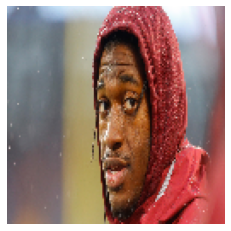

In [ ]:
plt.imshow(wrinkles_images[2])
plt.axis("off")

(-0.5, 127.5, 127.5, -0.5)

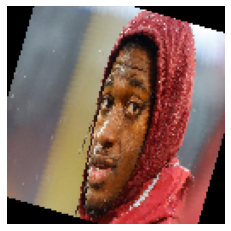

In [ ]:
plt.imshow(wrinkles_images[3])
plt.axis("off")

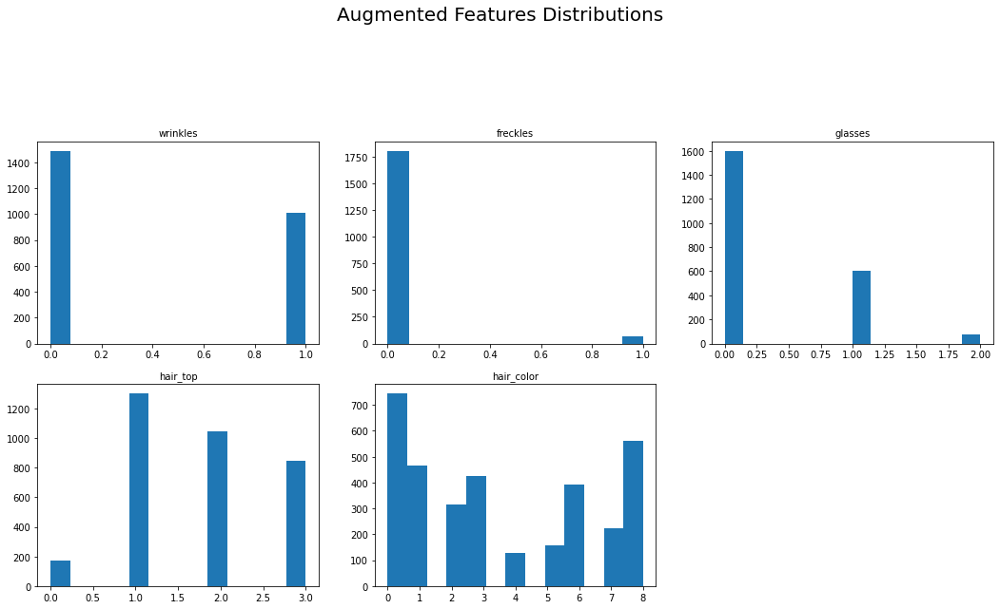

In [ ]:
# Checking Features Frequency
fig = plt.figure(figsize=(18, 18))
fig.suptitle('Augmented Features Distributions',fontsize=20, position=(0.5, 0.99))
selected = ['wrinkles','freckles','glasses','hair_top','hair_color']

bar = [df2,df3,df4,df5,df6]
counter = 1
i = 0
for name in selected:
    sub = fig.add_subplot(4, 3, counter)
    sub.set_title( name, fontsize=10)
    plt.hist(bar[i][name], bins='auto')  # arguments are passed to np.histogram
    counter += 1
    i +=1
plt.show()

# PART ONE: WRINKLES
## PREPROCESSING

In [ ]:
# Transform  wrinkles arrays to match uint8
X = np.array(wrinkles_images).astype('uint8')
y = np.array(df2['wrinkles']).astype('uint8')

In [ ]:
# Split the data into training and testing
train_images, test_images, train_labels, test_labels = train_test_split(X, y, test_size=0.1,random_state=10,stratify=y)

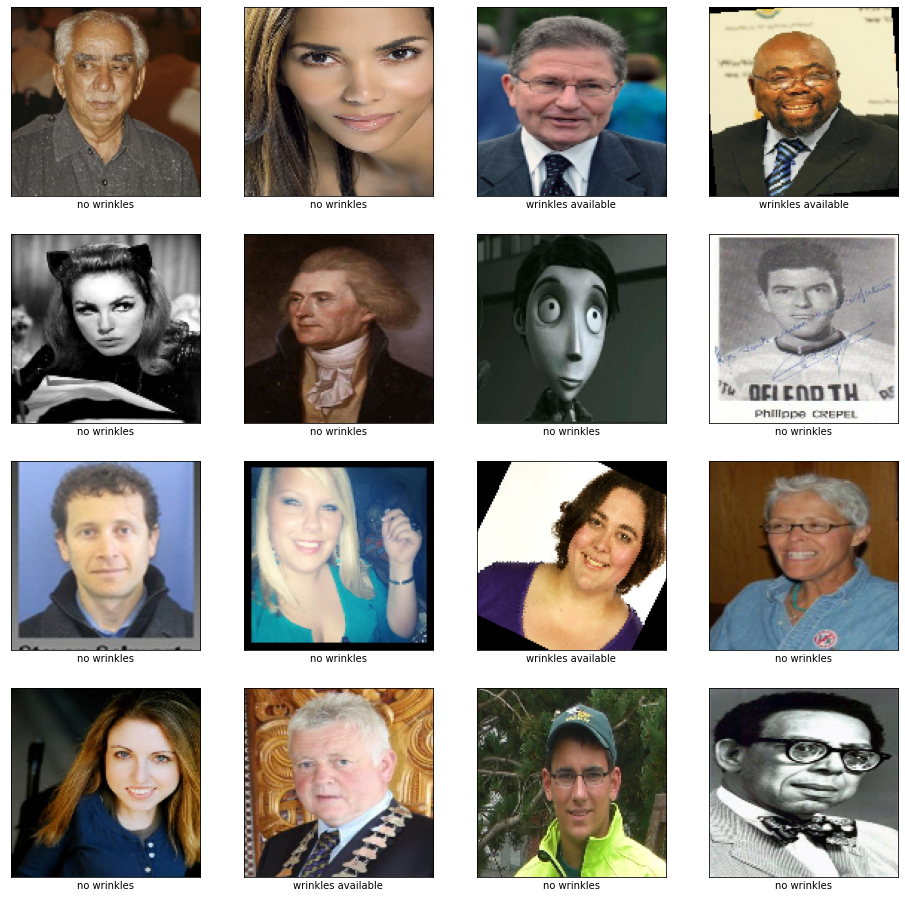

In [ ]:
# To verify that the dataset looks correct, let's plot the first 16 images from the training set and display the class name below each image.
class_names = ['no wrinkles','wrinkles available']

plt.figure(figsize=(16,16))
for i in range(0,16,1):
    plt.subplot(4,4,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    
    plt.imshow(train_images[i], cmap=plt.cm.binary)
    plt.xlabel(class_names[train_labels[i]])
plt.show()

In [ ]:
# Normalizing the data
train_images, test_images = train_images / 255, test_images / 255
print(f'Shape of the training data: {train_images.shape}')
print(f'Shape of the training target: {train_labels.shape}')
print(f'Shape of the test data: {test_images.shape}')
print(f'Shape of the test target: {test_labels.shape}')

Shape of the training data: (2245, 128, 128, 3)
Shape of the training target: (2245,)
Shape of the test data: (250, 128, 128, 3)
Shape of the test target: (250,)


## WRINKLES VS NO WRINKLES RATE

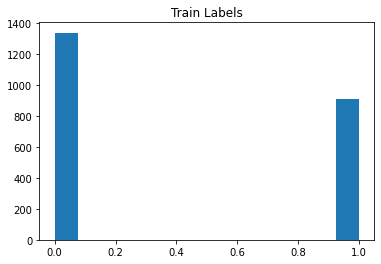

In [ ]:
plt.hist(train_labels, bins='auto')  # arguments are passed to np.histogram
plt.title("Train Labels")
plt.show()

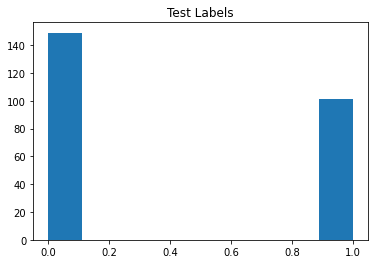

In [ ]:
plt.hist(test_labels, bins='auto')  # arguments are passed to np.histogram
plt.title("Test Labels")
plt.show()

# CUSTOM CNN TO DETECT WRINKLES THROUGH BINARY CLASSIFCATION (sigmoid)

Model: "model_4"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_5 (InputLayer)         [(None, 128, 128, 3)]     0         
_________________________________________________________________
sequential_13 (Sequential)   (None, 128, 128, 3)       0         
_________________________________________________________________
sequential_14 (Sequential)   (None, 8, 8, 64)          112576    
_________________________________________________________________
flatten_9 (Flatten)          (None, 4096)              0         
_________________________________________________________________
dense_9 (Dense)              (None, 2)                 8194      
Total params: 120,770
Trainable params: 120,770
Non-trainable params: 0
_________________________________________________________________
Epoch 1/20
17/17 [==============================] - 2s 100ms/step - loss: 0.6827 - accuracy: 0.5426 - val_loss: 0.6700 

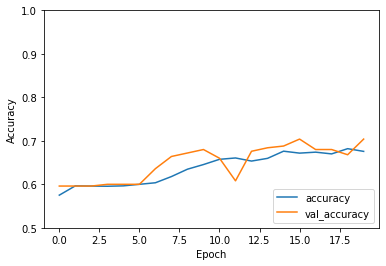

In [ ]:
# Data Augmentation
data_augmentation = keras.Sequential(
    [
        layers.experimental.preprocessing.RandomFlip("horizontal"),
        layers.experimental.preprocessing.RandomRotation(0.1),
        layers.experimental.preprocessing.RandomZoom(0.1),
    ]
)

# Create a model that includes the augmentation stage
input_shape = (128, 128, 3)

inputs = keras.Input(shape=input_shape)

# Augment images
x = data_augmentation(inputs)

# Add the rest of the model
model = keras.Sequential([
  layers.Conv2D(64, (3, 3), padding = 'SAME', activation='relu', input_shape=(128, 128, 3)),
  layers.MaxPooling2D((2, 2)),
  layers.Conv2D(64, (3, 3), padding = 'SAME', activation='relu'),
  layers.MaxPooling2D((2, 2)),
  layers.Conv2D(64, (3, 3), padding = 'SAME', activation='relu'),
  layers.MaxPooling2D((2, 2)),
  tf.keras.layers.Dropout(0.3),
  layers.Conv2D(64, (3, 3), padding = 'SAME', activation='relu'),
  layers.MaxPooling2D((2, 2))
])(x)

# add new classifier layers
flat1 = layers.Flatten()(model)
outputs = layers.Dense(2, activation='sigmoid')(flat1)

# define new model
model = Model(inputs=inputs, outputs= outputs)

model.compile(optimizers.Adam(learning_rate=0.0001),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(),
              metrics=['accuracy'])

model.summary()

# initialize the number of epochs and batch size
EPOCHS = 20
BS = 128


# train the network
history = model.fit(train_images, train_labels, shuffle= True,
	validation_data=(test_images, test_labels), steps_per_epoch=len(train_images) // BS,
	epochs=EPOCHS)

# Save model
model.save_weights('wrinkles_cnn_weights/')
model.save('wrinkles_cnn_model/')

# Validation
plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label = 'val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0.5, 1])
plt.legend(loc='lower right')

In [ ]:
# Evaluations
predictions = model.predict(test_images)
predictions_index = np.argmax(predictions, axis=1)
print(classification_report(test_labels, predictions_index))
matrix = metrics.confusion_matrix(test_labels, predictions_index)
print("CONFUSION MATRIX")
print(matrix)

              precision    recall  f1-score   support

           0       0.74      0.78      0.76       149
           1       0.65      0.59      0.62       101

    accuracy                           0.70       250
   macro avg       0.69      0.69      0.69       250
weighted avg       0.70      0.70      0.70       250

CONFUSION MATRIX
[[116  33]
 [ 41  60]]


# CHECKING MODEL PREDICTIONS

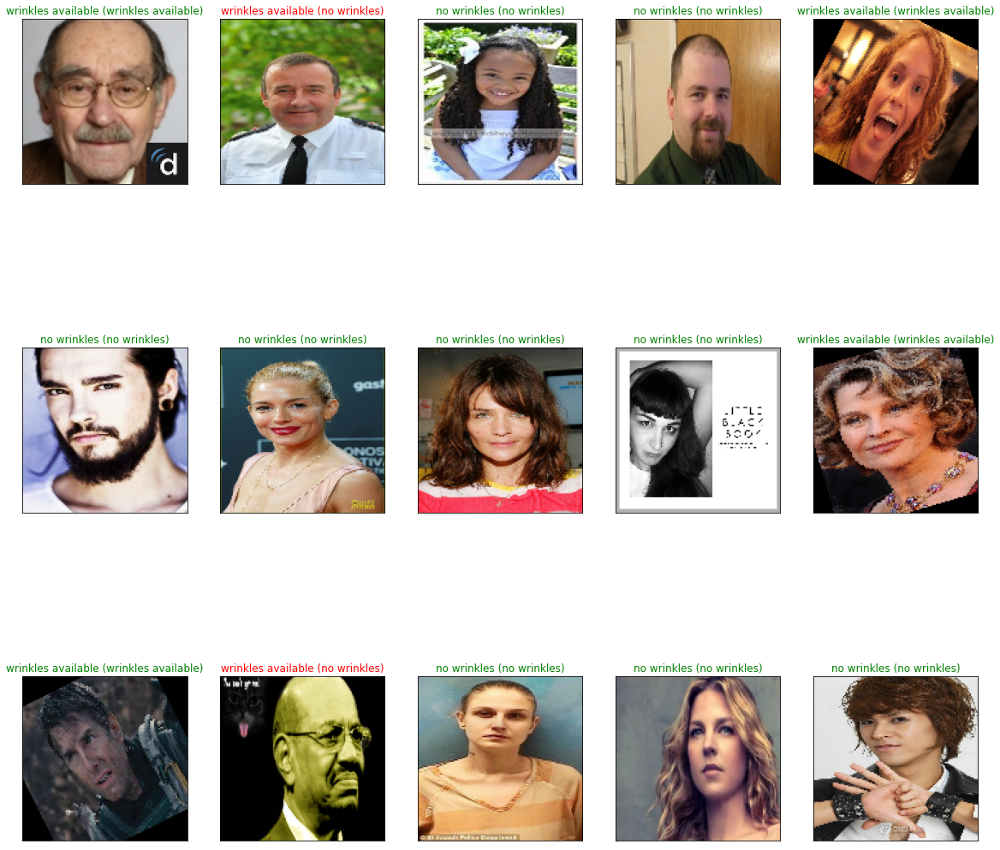

In [ ]:
import pdb
y_hat = model.predict(test_images)

# Plot a random sample of 15 test images, their predicted labels and ground truth
figure = plt.figure(figsize=(20, 20))
for i, index in enumerate(np.random.choice(test_images.shape[0], size=15, replace=False)):
    ax = figure.add_subplot(3, 5, i + 1, xticks=[], yticks=[])
    # Display each image
    ax.imshow(np.squeeze(test_images[index]))
    predict_index = np.argmax(y_hat[index])
    true_index = test_labels[index]
    # Set the title for each image
    ax.set_title("{} ({})".format(class_names[predict_index], 
                                  class_names[true_index]),
                                  color=("green" if predict_index == true_index else "red"))

# TESTING RESNET-50 MODEL ON WRINKLES

94773248/94765736 [==============================] - 1s 0us/step
Epoch 1/10
9/9 [==============================] - 25s 2s/step - loss: 0.9470 - accuracy: 0.6367 - val_loss: 0.6808 - val_accuracy: 0.5680
Epoch 2/10
9/9 [==============================] - 7s 795ms/step - loss: 0.0347 - accuracy: 0.9891 - val_loss: 0.6697 - val_accuracy: 0.5880
Epoch 3/10
9/9 [==============================] - 7s 798ms/step - loss: 0.0058 - accuracy: 0.9995 - val_loss: 0.6717 - val_accuracy: 0.5920
Epoch 4/10
9/9 [==============================] - 7s 803ms/step - loss: 0.0012 - accuracy: 1.0000 - val_loss: 0.6877 - val_accuracy: 0.5960
Epoch 5/10
9/9 [==============================] - 7s 805ms/step - loss: 8.2162e-04 - accuracy: 1.0000 - val_loss: 0.7083 - val_accuracy: 0.5960
Epoch 6/10
9/9 [==============================] - 7s 806ms/step - loss: 6.1303e-04 - accuracy: 1.0000 - val_loss: 0.7176 - val_accuracy: 0.5960
Epoch 7/10
9/9 [==============================] - 7s 806ms/step - loss: 4.0319e-04 - accu

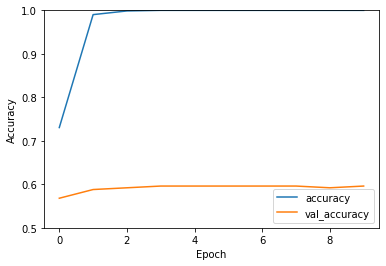

In [ ]:
# load model without classifier layers
model = ResNet50(include_top=False, weights="imagenet", input_shape=(128, 128, 3)) 
    

# add new classifier layers
flat1 = layers.Flatten()(model.layers[-1].output)
output = layers.Dense(2, activation='sigmoid')(flat1)


# define new model
model = Model(inputs=model.inputs, outputs=output)

model.compile(optimizers.Adam(learning_rate=0.0001),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(),
              metrics=['accuracy'])

# Training
history = model.fit(train_images, train_labels, epochs=10, batch_size=256,
                    validation_data=(test_images, test_labels))

# Validation
plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label = 'val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0.5, 1])
plt.legend(loc='lower right')

test_loss, test_acc = model.evaluate(test_images,  test_labels, verbose=2)

print(test_acc)

In [ ]:
# Evaluations
predictions = model.predict(test_images)
predictions_index = np.argmax(predictions, axis=1)
print(classification_report(test_labels, predictions_index))
matrix = metrics.confusion_matrix(test_labels, predictions_index)
print("CONFUSION MATRIX")
print(matrix)

              precision    recall  f1-score   support

           0       0.60      1.00      0.75       149
           1       0.00      0.00      0.00       101

    accuracy                           0.60       250
   macro avg       0.30      0.50      0.37       250
weighted avg       0.36      0.60      0.45       250

CONFUSION MATRIX
[[149   0]
 [101   0]]


##### Custom CNN had a much better perforamnce than just applying Resnet-50 since Resnet was not able to detect no wrinkles available label

# PART TWO: FRECKLES

## PREPROCESSING

In [ ]:
# Create two uint 8 arrays for freckels array and freckles images
X = np.array(freckles_images).astype('uint8')
y = np.array(df3['freckles']).astype('uint8')

In [ ]:
# Split the data
train_images, test_images, train_labels, test_labels = train_test_split(X, y, test_size=0.05,random_state=0,stratify=y)

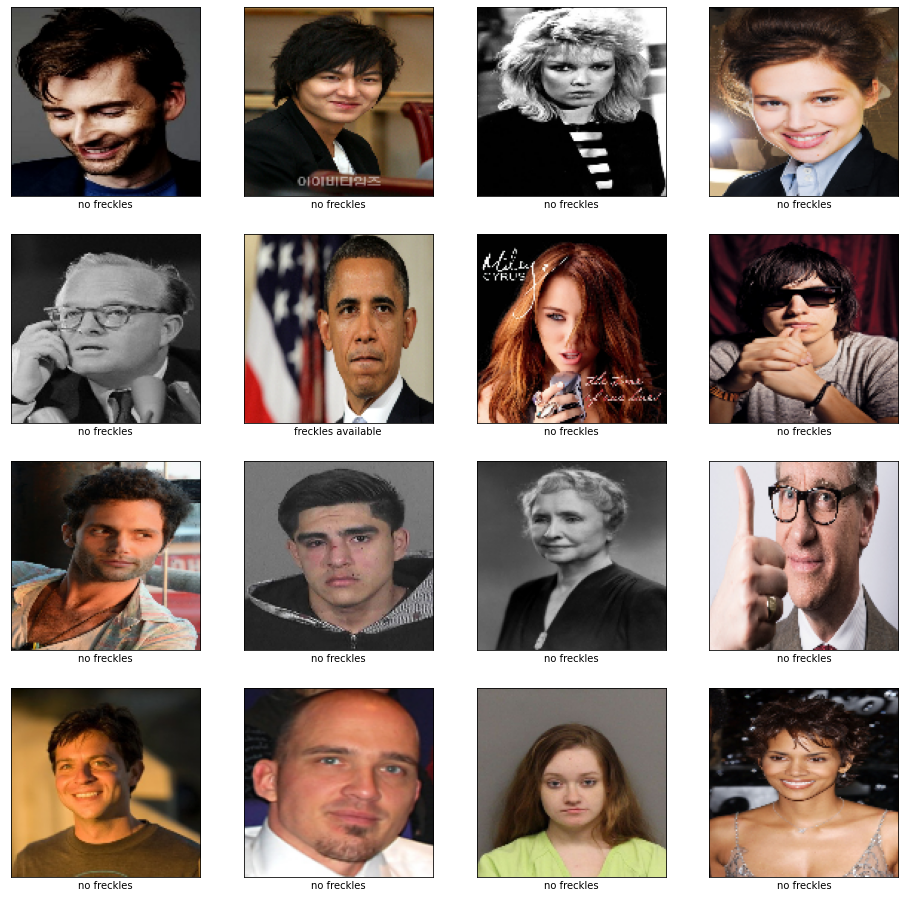

In [ ]:
# To verify that the dataset looks correct, let's plot the first 16 images from the training set and display the class name below each image.
class_names = ['no freckles','freckles available']

plt.figure(figsize=(16,16))
for i in range(0,16,1):
    plt.subplot(4,4,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    plt.imshow(train_images[i], cmap=plt.cm.binary)
    plt.xlabel(class_names[train_labels[i]])
plt.show()

In [ ]:
# Normalize the data
train_images, test_images = train_images / 255, test_images / 255
print(f'Shape of the training data: {train_images.shape}')
print(f'Shape of the training target: {train_labels.shape}')
print(f'Shape of the test data: {test_images.shape}')
print(f'Shape of the test target: {test_labels.shape}')

Shape of the training data: (1775, 128, 128, 3)
Shape of the training target: (1775,)
Shape of the test data: (94, 128, 128, 3)
Shape of the test target: (94,)


## FRECKLES AND NO FRECKLES RATES

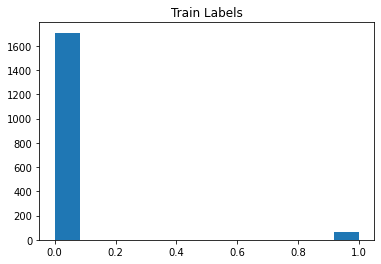

In [ ]:
plt.hist(train_labels, bins='auto') 
plt.title("Train Labels")
plt.show()

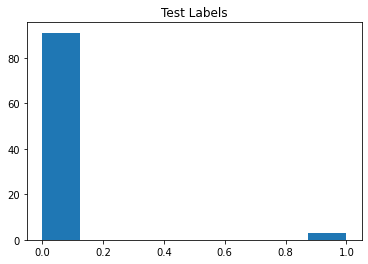

In [ ]:
plt.hist(test_labels, bins='auto') 
plt.title("Test Labels")
plt.show()

# CUSTOM CNN TO DETECT FRECKLES THROUGH BINARY CLASSIFCATION (sigmoid)

Model: "model_22"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_23 (InputLayer)        [(None, 128, 128, 3)]     0         
_________________________________________________________________
sequential_32 (Sequential)   (None, 128, 128, 3)       0         
_________________________________________________________________
sequential_33 (Sequential)   (None, 8, 8, 32)          38752     
_________________________________________________________________
flatten_22 (Flatten)         (None, 2048)              0         
_________________________________________________________________
dense_22 (Dense)             (None, 2)                 4098      
Total params: 42,850
Trainable params: 42,850
Non-trainable params: 0
_________________________________________________________________
Epoch 1/10
27/27 [==============================] - 2s 48ms/step - loss: 0.5490 - accuracy: 0.9173 - val_loss: 0.1908 - 

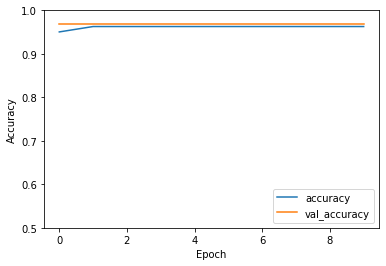

In [ ]:
# Data Augmentation
data_augmentation = keras.Sequential(
    [
        layers.experimental.preprocessing.RandomFlip("horizontal"),
        layers.experimental.preprocessing.RandomRotation(0.1),
        layers.experimental.preprocessing.RandomZoom(0.1),
    ]
)
# the augmentation is being made part of the model. Note that data augmentation is inactive at test time.

# Create a model that includes the augmentation stage
input_shape = (128, 128, 3)


inputs = keras.Input(shape=input_shape)

# Augment images
x = data_augmentation(inputs)

# Add the rest of the model
model = keras.Sequential([
  layers.Conv2D(64, (3, 3), padding = 'SAME', activation='relu', input_shape=(128, 128, 3)),
  layers.MaxPooling2D((2, 2)),
  layers.Conv2D(32, (3, 3), padding = 'SAME', activation='relu'),
  layers.MaxPooling2D((2, 2)),
  layers.Conv2D(32, (3, 3), padding = 'SAME', activation='relu'),
  layers.MaxPooling2D((2, 2)),  
  tf.keras.layers.Dropout(0.3),
  layers.Conv2D(32, (3, 3), padding = 'SAME', activation='relu'),
  layers.MaxPooling2D((2, 2))
])(x)

# add new classifier layers
flat1 = layers.Flatten()(model)
outputs = layers.Dense(2, activation='sigmoid')(flat1)

# define new model
model = Model(inputs=inputs, outputs= outputs)


model.compile(optimizers.Adam(learning_rate=0.0001),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(),
              metrics=['accuracy'])

model.summary()

# initialize the number of epochs and batch size
EPOCHS = 10
BS = 64


# train the network
history = model.fit(train_images, train_labels, shuffle= True,
	validation_data=(test_images, test_labels), steps_per_epoch=len(train_images) // BS,
	epochs=EPOCHS)

# Save model
model.save_weights('freckles_cnn_weights/')
model.save('frekles__cnn_model/')

# Validation
plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label = 'val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0.5, 1])
plt.legend(loc='lower right')

In [ ]:
# Evaluations
predictions = model.predict(test_images)
predictions_index = np.argmax(predictions, axis=1)
print(classification_report(test_labels, predictions_index))
matrix = metrics.confusion_matrix(test_labels, predictions_index)
print("CONFUSION MATRIX")
print(matrix)

              precision    recall  f1-score   support

           0       0.97      1.00      0.98        91
           1       0.00      0.00      0.00         3

    accuracy                           0.97        94
   macro avg       0.48      0.50      0.49        94
weighted avg       0.94      0.97      0.95        94

CONFUSION MATRIX
[[91  0]
 [ 3  0]]


## CHECKING MODEL PREDICTIONS

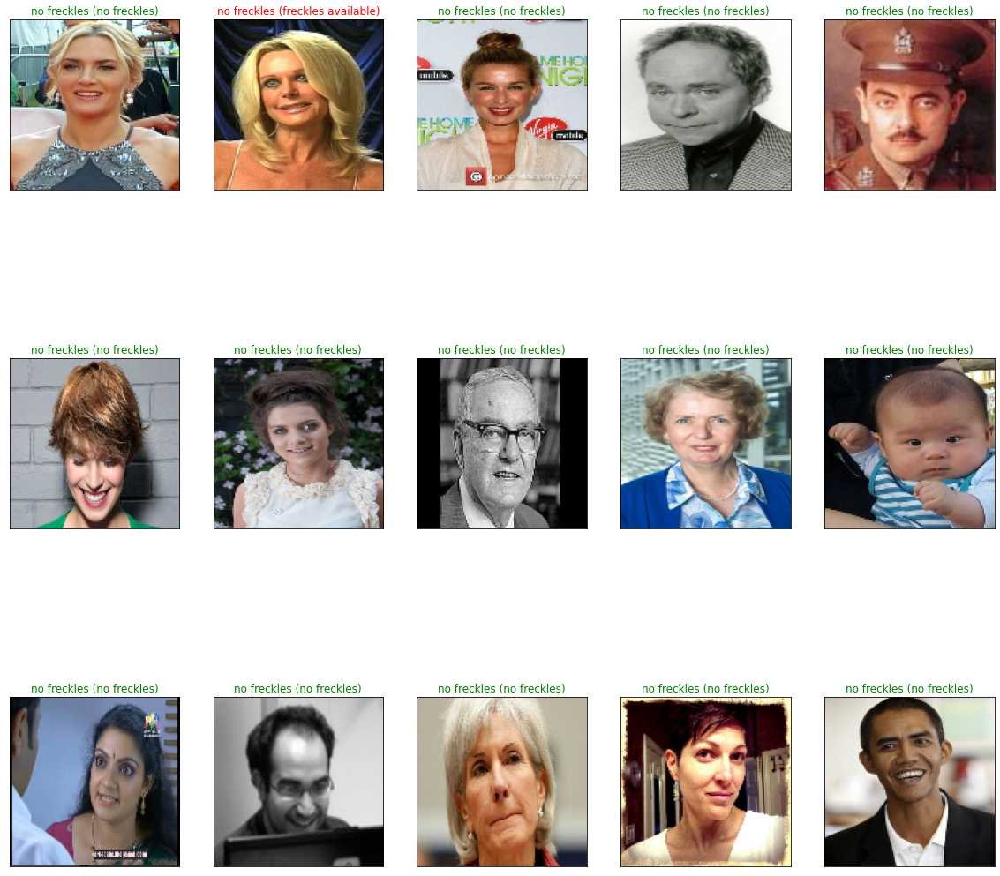

In [ ]:
import pdb
y_hat = model.predict(test_images)

# Plot a random sample of 15 test images, their predicted labels and ground truth
figure = plt.figure(figsize=(20, 20))
for i, index in enumerate(np.random.choice(test_images.shape[0], size=15, replace=False)):
    ax = figure.add_subplot(3, 5, i + 1, xticks=[], yticks=[])
    # Display each image
    ax.imshow(np.squeeze(test_images[index]))
    predict_index = np.argmax(y_hat[index])
    true_index = test_labels[index]
    # Set the title for each image
    ax.set_title("{} ({})".format(class_names[predict_index], 
                                  class_names[true_index]),
                                  color=("green" if predict_index == true_index else "red"))

# TESTING RESNET-50 ON FRECKLES

Epoch 1/10
7/7 [==============================] - 19s 2s/step - loss: 0.6120 - accuracy: 0.8105 - val_loss: 0.1361 - val_accuracy: 0.9681
Epoch 2/10
7/7 [==============================] - 6s 863ms/step - loss: 0.0051 - accuracy: 0.9987 - val_loss: 0.2788 - val_accuracy: 0.9681
Epoch 3/10
7/7 [==============================] - 6s 852ms/step - loss: 2.4828e-04 - accuracy: 1.0000 - val_loss: 0.3962 - val_accuracy: 0.9681
Epoch 4/10
7/7 [==============================] - 6s 844ms/step - loss: 3.6333e-04 - accuracy: 1.0000 - val_loss: 0.4571 - val_accuracy: 0.9681
Epoch 5/10
7/7 [==============================] - 6s 842ms/step - loss: 2.4706e-04 - accuracy: 1.0000 - val_loss: 0.4795 - val_accuracy: 0.9681
Epoch 6/10
7/7 [==============================] - 6s 831ms/step - loss: 1.7999e-04 - accuracy: 1.0000 - val_loss: 0.4864 - val_accuracy: 0.9681
Epoch 7/10
7/7 [==============================] - 6s 829ms/step - loss: 1.2899e-04 - accuracy: 1.0000 - val_loss: 0.4867 - val_accuracy: 0.9681
Ep

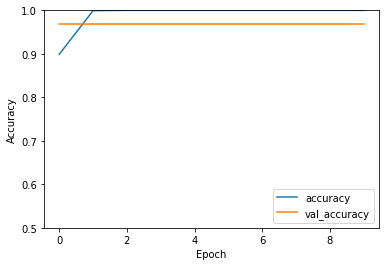

In [ ]:
from keras.applications.resnet50 import ResNet50
from keras.models import Model

# load model without classifier layers
model = ResNet50(include_top=False, weights="imagenet", input_shape=(128, 128, 3)) 
    

# add new classifier layers
flat1 = layers.Flatten()(model.layers[-1].output)
output = layers.Dense(2, activation='sigmoid')(flat1)


# define new model
model = Model(inputs=model.inputs, outputs=output)

model.compile(optimizers.Adam(learning_rate=0.0001),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(),
              metrics=['accuracy'])

# Training
history = model.fit(train_images, train_labels, epochs=10, batch_size=256,
                    validation_data=(test_images, test_labels))

# Validation
plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label = 'val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0.5, 1])
plt.legend(loc='lower right')

test_loss, test_acc = model.evaluate(test_images,  test_labels, verbose=2)

print(test_acc)

In [ ]:
# Evaluations
predictions = model.predict(test_images)
predictions_index = np.argmax(predictions, axis=1)
print(classification_report(test_labels, predictions_index))
matrix = metrics.confusion_matrix(test_labels, predictions_index)
print("CONFUSION MATRIX")
print(matrix)

              precision    recall  f1-score   support

           0       0.97      1.00      0.98        91
           1       0.00      0.00      0.00         3

    accuracy                           0.97        94
   macro avg       0.48      0.50      0.49        94
weighted avg       0.94      0.97      0.95        94

CONFUSION MATRIX
[[91  0]
 [ 3  0]]


##### Due to the low count of freckles images, both methods were not able to detect freckles feature for the images

# PART THREE: GLASSES

## PREPROCESSING

In [ ]:
# Create two uint 8 arrays
X = np.array(glasses_images).astype('uint8')
y = np.array(df4['glasses']).astype('uint8')

In [ ]:
# Split the data
train_images, test_images, train_labels, test_labels = train_test_split(X, y, test_size=0.1,random_state=0,stratify=y)

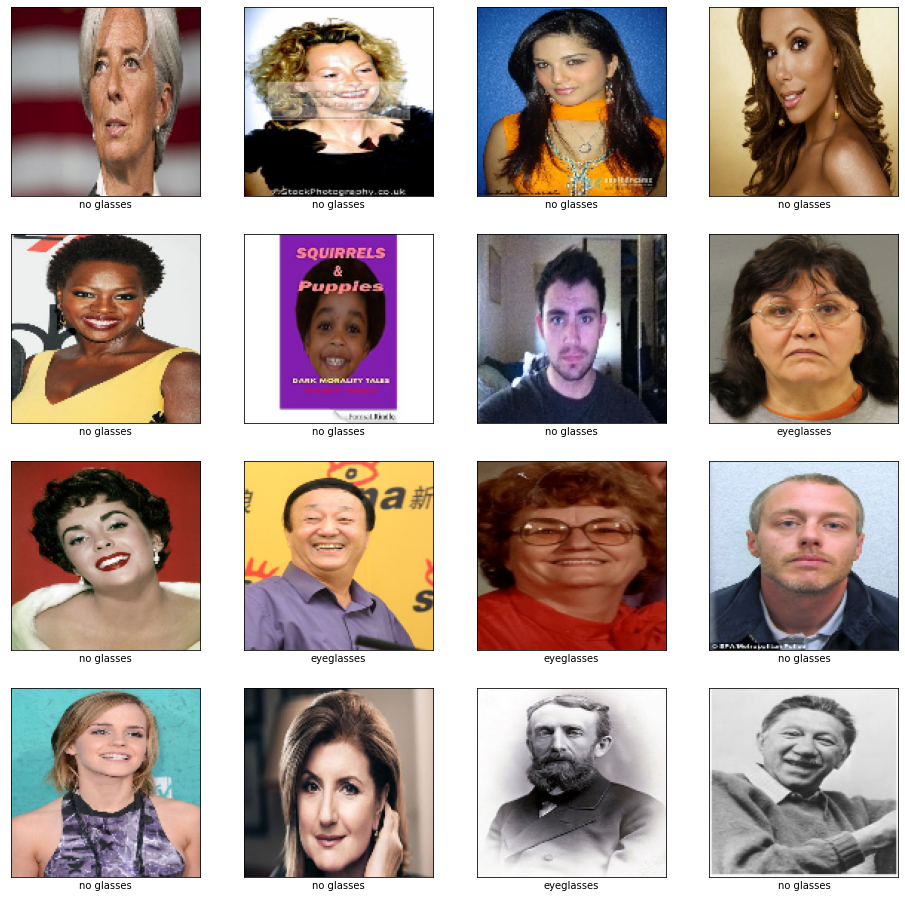

In [ ]:
# To verify that the dataset looks correct, let's plot the first 16 images from the training set and display the class name below each image.
class_names = ['no glasses','eyeglasses','sunglasses']

plt.figure(figsize=(16,16))
for i in range(0,16,1):
    plt.subplot(4,4,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    
    plt.imshow(train_images[i], cmap=plt.cm.binary)
    plt.xlabel(class_names[train_labels[i]])
plt.show()

In [ ]:
# Normalize the data
train_images, test_images = train_images / 255, test_images / 255
print(f'Shape of the training data: {train_images.shape}')
print(f'Shape of the training target: {train_labels.shape}')
print(f'Shape of the test data: {test_images.shape}')
print(f'Shape of the test target: {test_labels.shape}')

Shape of the training data: (2047, 128, 128, 3)
Shape of the training target: (2047,)
Shape of the test data: (228, 128, 128, 3)
Shape of the test target: (228,)


## NO GLASSES, EYEGLASSES AND SUNGLASSES RATES

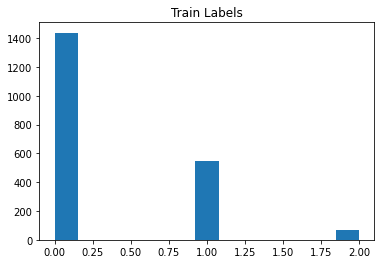

In [ ]:
plt.hist(train_labels, bins='auto') 
plt.title("Train Labels")
plt.show()

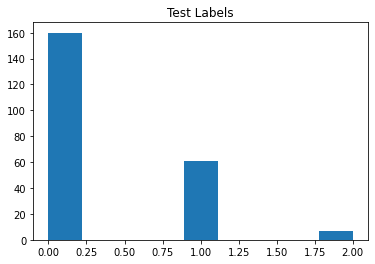

In [ ]:
plt.hist(test_labels, bins='auto') 
plt.title("Test Labels")
plt.show()

# CUSTOM CNN TO DETECT GLASSES THROUGH CATEGORICAL CLASSIFCATION (softmax)

Model: "model_25"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_25 (InputLayer)        [(None, 128, 128, 3)]     0         
_________________________________________________________________
sequential_36 (Sequential)   (None, 128, 128, 3)       0         
_________________________________________________________________
sequential_37 (Sequential)   (None, 8, 8, 64)          112576    
_________________________________________________________________
flatten_24 (Flatten)         (None, 4096)              0         
_________________________________________________________________
dense_24 (Dense)             (None, 3)                 12291     
Total params: 124,867
Trainable params: 124,867
Non-trainable params: 0
_________________________________________________________________
Epoch 1/10
31/31 [==============================] - 2s 53ms/step - loss: 0.9735 - accuracy: 0.5818 - val_loss: 0.7507 

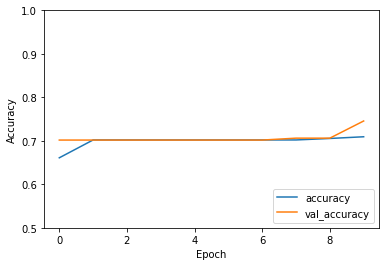

In [ ]:
# Data Augmentation
data_augmentation = keras.Sequential(
    [
        layers.experimental.preprocessing.RandomFlip("horizontal"),
        layers.experimental.preprocessing.RandomRotation(0.1),
        layers.experimental.preprocessing.RandomZoom(0.1),
    ]
)
# the augmentation is being made part of the model. Note that data augmentation is inactive at test time.

# Create a model that includes the augmentation stage
input_shape = (128, 128, 3)


inputs = keras.Input(shape=input_shape)

# Augment images
x = data_augmentation(inputs)

# Add the rest of the model
model = keras.Sequential([
  layers.Conv2D(64, (3, 3), padding = 'SAME', activation='relu', input_shape=(128, 128, 3)),
  layers.MaxPooling2D((2, 2)),
  layers.Conv2D(64, (3, 3), padding = 'SAME', activation='relu'),
  layers.MaxPooling2D((2, 2)),
  layers.Conv2D(64, (3, 3), padding = 'SAME', activation='relu'),
  layers.MaxPooling2D((2, 2)),
  tf.keras.layers.Dropout(0.3),
  layers.Conv2D(64, (3, 3), padding = 'SAME', activation='relu'),
  layers.MaxPooling2D((2, 2))
])(x)

# add new classifier layers
flat1 = layers.Flatten()(model)
outputs = layers.Dense(3, activation='softmax')(flat1)

# define new model
model = Model(inputs=inputs, outputs= outputs)


model.compile(optimizers.Adam(learning_rate=0.0001),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(),
              metrics=['accuracy'])

model.summary()

# initialize the number of epochs and batch size
EPOCHS = 10
BS = 64


# train the network
history = model.fit(train_images, train_labels, shuffle= True,
	validation_data=(test_images, test_labels), steps_per_epoch=len(train_images) // BS,
	epochs=EPOCHS)

# Save model
model.save_weights('glasses_cnn_weights/')
model.save('glasses_cnn_model/')

# Validation
plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label = 'val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0.5, 1])
plt.legend(loc='lower right')

In [ ]:
# Evaluations
predictions = model.predict(test_images)
predictions_index = np.argmax(predictions, axis=1)
print(classification_report(test_labels, predictions_index))
matrix = metrics.confusion_matrix(test_labels, predictions_index)
print("CONFUSION MATRIX")
print(matrix)

              precision    recall  f1-score   support

           0       0.73      0.99      0.84       160
           1       0.77      0.16      0.27        61
           2       0.00      0.00      0.00         7

    accuracy                           0.74       228
   macro avg       0.50      0.38      0.37       228
weighted avg       0.72      0.74      0.66       228

CONFUSION MATRIX
[[158   2   0]
 [ 51  10   0]
 [  6   1   0]]


## CHECKING MODEL PREDICTIONS

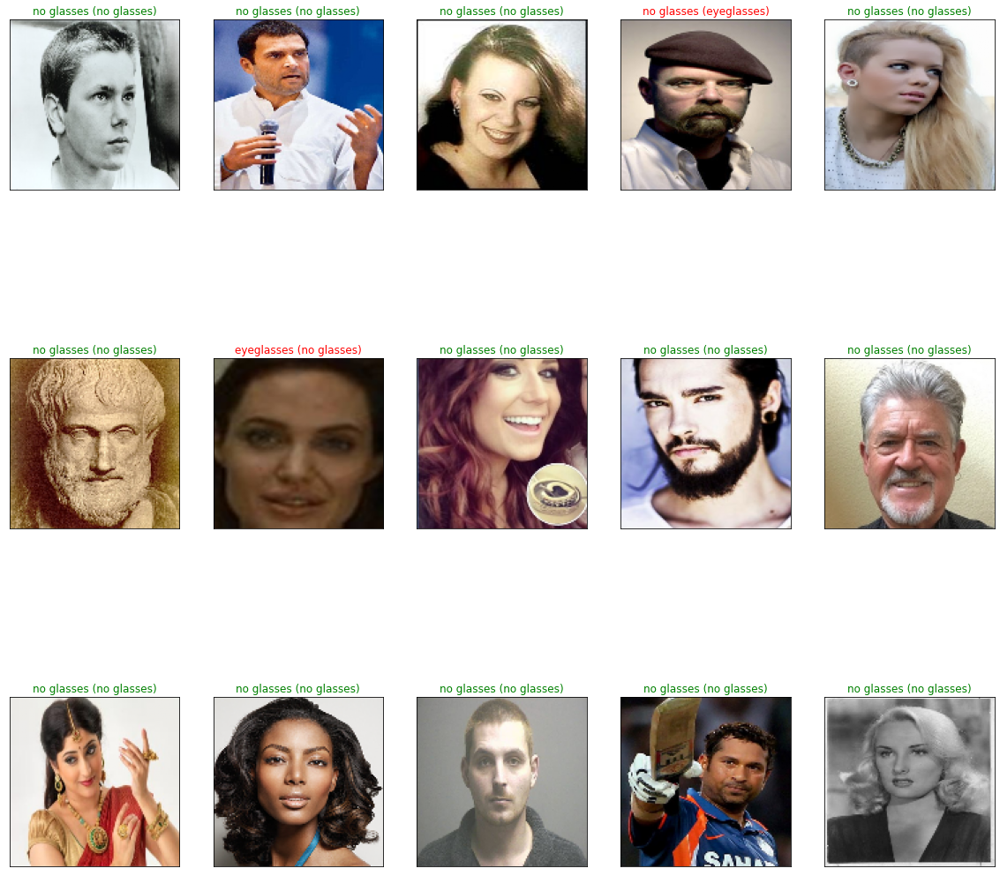

In [ ]:
import pdb
y_hat = model.predict(test_images)

# Plot a random sample of 15 test images, their predicted labels and ground truth
figure = plt.figure(figsize=(20, 20))
for i, index in enumerate(np.random.choice(test_images.shape[0], size=15, replace=False)):
    ax = figure.add_subplot(3, 5, i + 1, xticks=[], yticks=[])
    # Display each image
    ax.imshow(np.squeeze(test_images[index]))
    predict_index = np.argmax(y_hat[index])
    true_index = test_labels[index]
    # Set the title for each image
    ax.set_title("{} ({})".format(class_names[predict_index], 
                                  class_names[true_index]),
                                  color=("green" if predict_index == true_index else "red"))

# TESTING RESNET-50 ON GLASSES

Epoch 1/10
8/8 [==============================] - 22s 2s/step - loss: 1.2152 - accuracy: 0.6484 - val_loss: 1.1275 - val_accuracy: 0.3640
Epoch 2/10
8/8 [==============================] - 7s 895ms/step - loss: 0.0251 - accuracy: 0.9929 - val_loss: 0.8733 - val_accuracy: 0.7018
Epoch 3/10
8/8 [==============================] - 7s 876ms/step - loss: 0.0076 - accuracy: 0.9996 - val_loss: 0.8803 - val_accuracy: 0.7018
Epoch 4/10
8/8 [==============================] - 7s 865ms/step - loss: 0.0019 - accuracy: 1.0000 - val_loss: 0.8997 - val_accuracy: 0.7018
Epoch 5/10
8/8 [==============================] - 7s 858ms/step - loss: 7.6705e-04 - accuracy: 1.0000 - val_loss: 0.9305 - val_accuracy: 0.7018
Epoch 6/10
8/8 [==============================] - 7s 852ms/step - loss: 4.6497e-04 - accuracy: 1.0000 - val_loss: 1.0145 - val_accuracy: 0.7018
Epoch 7/10
8/8 [==============================] - 7s 852ms/step - loss: 3.7463e-04 - accuracy: 1.0000 - val_loss: 1.1425 - val_accuracy: 0.7018
Epoch 8/10

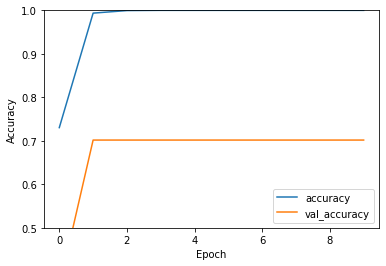

In [ ]:
from keras.applications.resnet50 import ResNet50
from keras.models import Model

# load model without classifier layers
model = ResNet50(include_top=False, weights="imagenet", input_shape=(128, 128, 3)) 
    

# add new classifier layers
flat1 = layers.Flatten()(model.layers[-1].output)
output = layers.Dense(3, activation='softmax')(flat1)


# define new model
model = Model(inputs=model.inputs, outputs=output)

model.compile(optimizers.Adam(learning_rate=0.0001),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(),
              metrics=['accuracy'])

# Training
history = model.fit(train_images, train_labels, epochs=10, batch_size=256,
                    validation_data=(test_images, test_labels))

# Validation
plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label = 'val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0.5, 1])
plt.legend(loc='lower right')

test_loss, test_acc = model.evaluate(test_images,  test_labels, verbose=2)

print(test_acc)

In [ ]:
# Evaluations
predictions = model.predict(test_images)
predictions_index = np.argmax(predictions, axis=1)
print(classification_report(test_labels, predictions_index))
matrix = metrics.confusion_matrix(test_labels, predictions_index)
print("CONFUSION MATRIX")
print(matrix)

              precision    recall  f1-score   support

           0       0.70      1.00      0.82       160
           1       0.00      0.00      0.00        61
           2       0.00      0.00      0.00         7

    accuracy                           0.70       228
   macro avg       0.23      0.33      0.27       228
weighted avg       0.49      0.70      0.58       228

CONFUSION MATRIX
[[160   0   0]
 [ 61   0   0]
 [  7   0   0]]


# PART FOUR: HAIR TOP

## PREPROCESSING

In [ ]:
# Create two uint 8 arrays
X = np.array(hair_images).astype('uint8')
y = np.array(df5['hair_top']).astype('uint8')

In [ ]:
# Split the data
train_images, test_images, train_labels, test_labels = train_test_split(X, y, test_size=0.2,random_state=0)

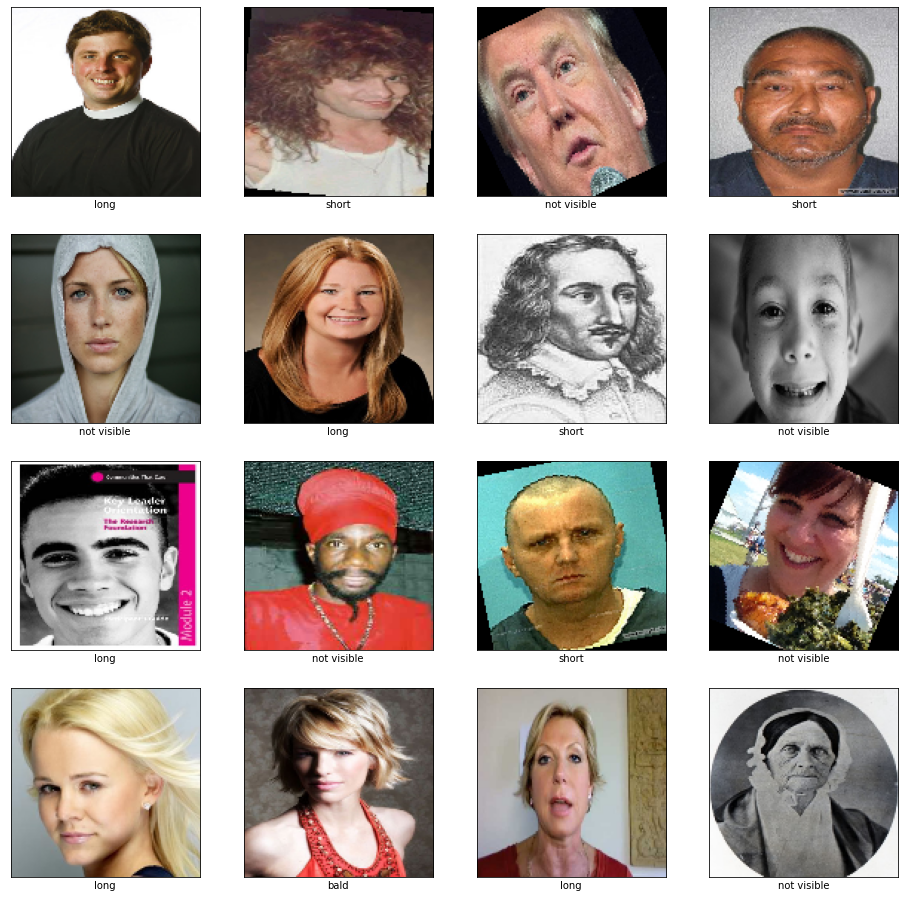

In [ ]:
# To verify that the dataset looks correct, let's plot the first 16 images from the training set and display the class name below each image.
class_names = ['bald','short','long','not visible']

plt.figure(figsize=(16,16))
for i in range(0,16,1):
    plt.subplot(4,4,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    
    plt.imshow(train_images[i], cmap=plt.cm.binary)
    plt.xlabel(class_names[train_labels[i]])
plt.show()

In [ ]:
# Normalize the data
train_images, test_images = train_images / 255, test_images / 255
print(f'Shape of the training data: {train_images.shape}')
print(f'Shape of the training target: {train_labels.shape}')
print(f'Shape of the test data: {test_images.shape}')
print(f'Shape of the test target: {test_labels.shape}')

Shape of the training data: (2696, 128, 128, 3)
Shape of the training target: (2696,)
Shape of the test data: (675, 128, 128, 3)
Shape of the test target: (675,)


## HAIR LENGTH RATES RATES

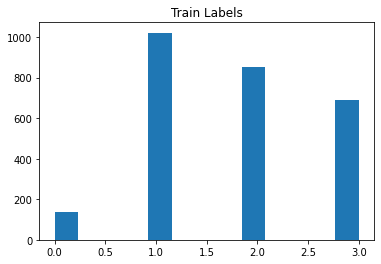

In [ ]:
plt.hist(train_labels, bins='auto') 
plt.title("Train Labels")
plt.show()

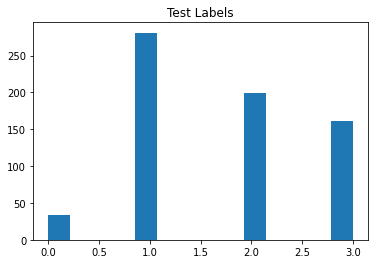

In [ ]:
plt.hist(test_labels, bins='auto') 
plt.title("Test Labels")
plt.show()

# CUSTOM CNN TO DETECT HAIR LENGTH THROUGH CATEGORICAL CLASSIFCATION (softmax)

Model: "model_26"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_26 (InputLayer)        [(None, 128, 128, 3)]     0         
_________________________________________________________________
sequential_38 (Sequential)   (None, 128, 128, 3)       0         
_________________________________________________________________
sequential_39 (Sequential)   (None, 8, 8, 64)          112576    
_________________________________________________________________
flatten_25 (Flatten)         (None, 4096)              0         
_________________________________________________________________
dense_25 (Dense)             (None, 4)                 16388     
Total params: 128,964
Trainable params: 128,964
Non-trainable params: 0
_________________________________________________________________
Epoch 1/20
42/42 [==============================] - 3s 51ms/step - loss: 1.2779 - accuracy: 0.3500 - val_loss: 1.2403 

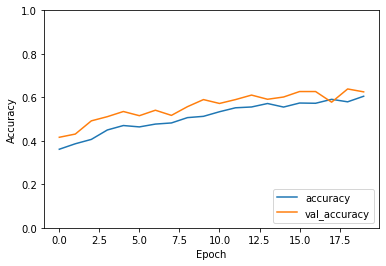

In [ ]:
# Data Augmentation
data_augmentation = keras.Sequential(
    [
        layers.experimental.preprocessing.RandomFlip("horizontal"),
        layers.experimental.preprocessing.RandomRotation(0.1),
        layers.experimental.preprocessing.RandomZoom(0.1),
    ]
)
# the augmentation is being made part of the model. Note that data augmentation is inactive at test time.

# Create a model that includes the augmentation stage
input_shape = (128, 128, 3)


inputs = keras.Input(shape=input_shape)

# Augment images
x = data_augmentation(inputs)

# Add the rest of the model
model = keras.Sequential([
  layers.Conv2D(64, (3, 3), padding = 'SAME', activation='relu', input_shape=(128, 128, 3)),
  layers.MaxPooling2D((2, 2)),
  layers.Conv2D(64, (3, 3), padding = 'SAME', activation='relu'),
  layers.MaxPooling2D((2, 2)),
  layers.Conv2D(64, (3, 3), padding = 'SAME', activation='relu'),
  layers.MaxPooling2D((2, 2)),
  tf.keras.layers.Dropout(0.3),
  layers.Conv2D(64, (3, 3), padding = 'SAME', activation='relu'),
  layers.MaxPooling2D((2, 2))
])(x)

# add new classifier layers
flat1 = layers.Flatten()(model)
outputs = layers.Dense(4, activation='softmax')(flat1)

# define new model
model = Model(inputs=inputs, outputs= outputs)


model.compile(optimizers.Adam(learning_rate=0.001),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(),
              metrics=['accuracy'])

model.summary()

# initialize the number of epochs and batch size
EPOCHS = 20
BS = 64


# train the network
history = model.fit(train_images, train_labels, shuffle= True,
	validation_data=(test_images, test_labels), steps_per_epoch=len(train_images) // BS,
	epochs=EPOCHS)

# Save model
model.save_weights('top_hair_cnn_weights/')
model.save('top_hair_cnn_model/')

# Validation
plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label = 'val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0, 1])
plt.legend(loc='lower right')

In [ ]:
# Evaluations
predictions = model.predict(test_images)
predictions_index = np.argmax(predictions, axis=1)
print(classification_report(test_labels, predictions_index))
matrix = metrics.confusion_matrix(test_labels, predictions_index)
print("CONFUSION MATRIX")
print(matrix)

              precision    recall  f1-score   support

           0       0.62      0.15      0.24        34
           1       0.65      0.74      0.69       281
           2       0.72      0.51      0.60       199
           3       0.51      0.66      0.58       161

    accuracy                           0.62       675
   macro avg       0.63      0.52      0.53       675
weighted avg       0.64      0.62      0.61       675

CONFUSION MATRIX
[[  5  14   8   7]
 [  0 207  19  55]
 [  2  56 102  39]
 [  1  40  13 107]]


## CHECKING MODEL PREDICTIONS

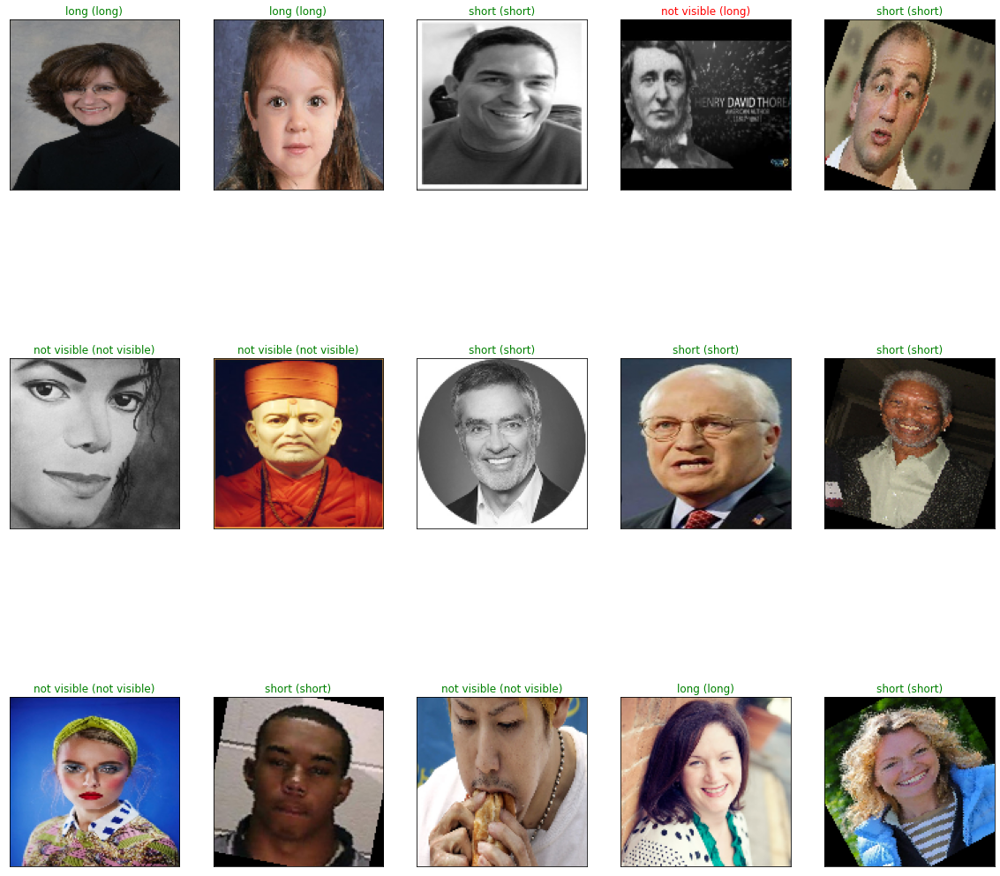

In [ ]:
import pdb
y_hat = model.predict(test_images)

# Plot a random sample of 15 test images, their predicted labels and ground truth
figure = plt.figure(figsize=(20, 20))
for i, index in enumerate(np.random.choice(test_images.shape[0], size=15, replace=False)):
    ax = figure.add_subplot(3, 5, i + 1, xticks=[], yticks=[])
    # Display each image
    ax.imshow(np.squeeze(test_images[index]))
    predict_index = np.argmax(y_hat[index])
    true_index = test_labels[index]
    # Set the title for each image
    ax.set_title("{} ({})".format(class_names[predict_index], 
                                  class_names[true_index]),
                                  color=("green" if predict_index == true_index else "red"))

# TESTING RESNET-50 ON TOP HAIR

Epoch 1/10
11/11 [==============================] - 21s 2s/step - loss: 1.7892 - accuracy: 0.4706 - val_loss: 1.3738 - val_accuracy: 0.2400
Epoch 2/10
11/11 [==============================] - 10s 892ms/step - loss: 0.0594 - accuracy: 0.9856 - val_loss: 1.2521 - val_accuracy: 0.3407
Epoch 3/10
11/11 [==============================] - 10s 875ms/step - loss: 0.0161 - accuracy: 0.9986 - val_loss: 1.3161 - val_accuracy: 0.3719
Epoch 4/10
11/11 [==============================] - 9s 860ms/step - loss: 0.0045 - accuracy: 0.9996 - val_loss: 1.4098 - val_accuracy: 0.3185
Epoch 5/10
11/11 [==============================] - 9s 854ms/step - loss: 0.0022 - accuracy: 1.0000 - val_loss: 1.4368 - val_accuracy: 0.3585
Epoch 6/10
11/11 [==============================] - 9s 853ms/step - loss: 0.0014 - accuracy: 1.0000 - val_loss: 1.4817 - val_accuracy: 0.3926
Epoch 7/10
11/11 [==============================] - 9s 859ms/step - loss: 0.0010 - accuracy: 1.0000 - val_loss: 1.5169 - val_accuracy: 0.4133
Epoch 

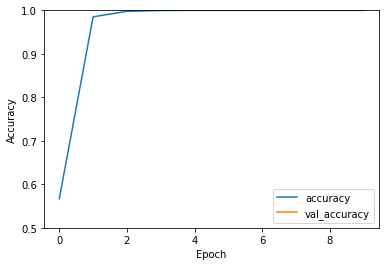

In [ ]:
from keras.applications.resnet50 import ResNet50
from keras.models import Model

# load model without classifier layers
model = ResNet50(include_top=False, weights="imagenet", input_shape=(128, 128, 3)) 
    

# add new classifier layers
flat1 = layers.Flatten()(model.layers[-1].output)
output = layers.Dense(4, activation='softmax')(flat1)


# define new model
model = Model(inputs=model.inputs, outputs=output)

model.compile(optimizers.Adam(learning_rate=0.0001),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(),
              metrics=['accuracy'])

# Training
history = model.fit(train_images, train_labels, epochs=10, batch_size=256,
                    validation_data=(test_images, test_labels))

# Validation
plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label = 'val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0.5, 1])
plt.legend(loc='lower right')

test_loss, test_acc = model.evaluate(test_images,  test_labels, verbose=2)

print(test_acc)

In [ ]:
# Evaluations
predictions = model.predict(test_images)
predictions_index = np.argmax(predictions, axis=1)
print(classification_report(test_labels, predictions_index))
matrix = metrics.confusion_matrix(test_labels, predictions_index)
print("CONFUSION MATRIX")
print(matrix)

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        34
           1       0.41      0.96      0.58       281
           2       0.20      0.02      0.03       199
           3       0.00      0.00      0.00       161

    accuracy                           0.41       675
   macro avg       0.15      0.24      0.15       675
weighted avg       0.23      0.41      0.25       675

CONFUSION MATRIX
[[  0  33   1   0]
 [  0 271  10   0]
 [  0 196   3   0]
 [  0 160   1   0]]


#### RESNET had a very bad accuracy compared to custom CNN

# PART FOUR: HAIR COLOUR

## PREPROCESSING

In [ ]:
# Create two uint 8 arrays
X = np.array(hair_colors_images).astype('uint8')
y = np.array(df6['hair_color']).astype('uint8')

In [ ]:
# Split the data
train_images, test_images, train_labels, test_labels = train_test_split(X, y, test_size=0.06,random_state=0,stratify=y)

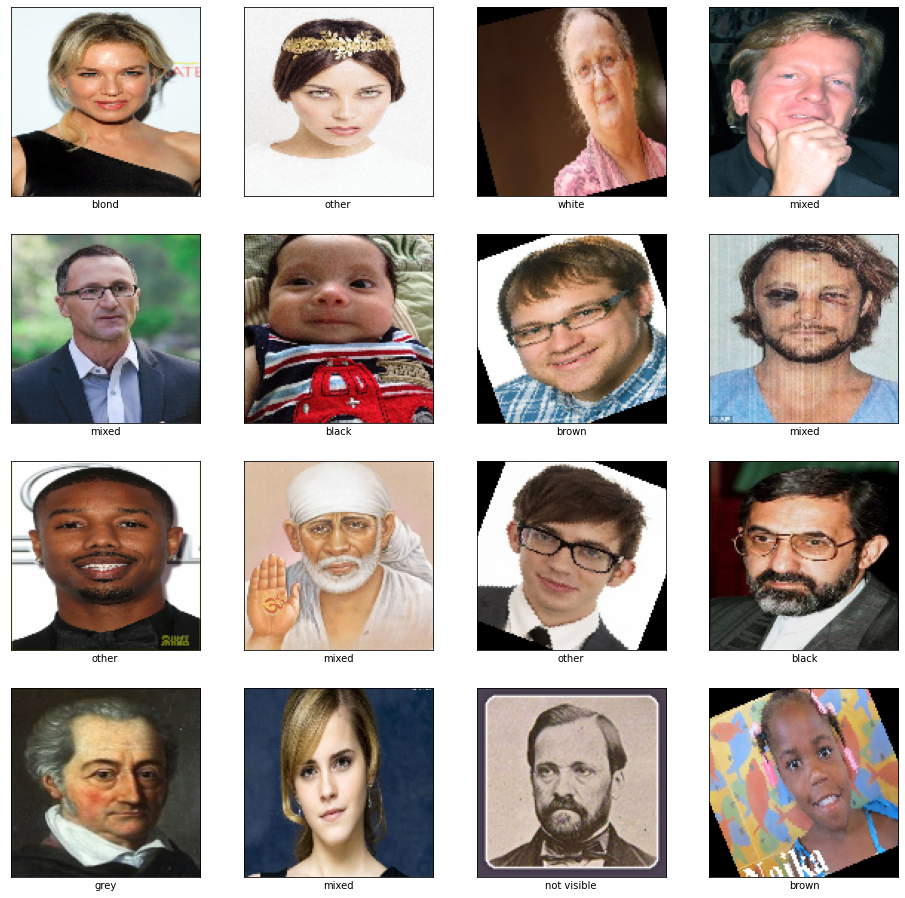

In [ ]:
# To verify that the dataset looks correct, let's plot the first 16 images from the training set and display the class name below each image.
class_names = ['brown','black','grey','blond','red','white','mixed','other','not visible']

plt.figure(figsize=(16,16))
for i in range(0,16,1):
    plt.subplot(4,4,i+1)
    plt.xticks([])
    plt.yticks([])
    plt.grid(False)
    
    plt.imshow(train_images[i], cmap=plt.cm.binary)
    plt.xlabel(class_names[train_labels[i]])
plt.show()

In [ ]:
# Normalize the data
train_images, test_images = train_images / 255, test_images / 255
print(f'Shape of the training data: {train_images.shape}')
print(f'Shape of the training target: {train_labels.shape}')
print(f'Shape of the test data: {test_images.shape}')
print(f'Shape of the test target: {test_labels.shape}')

Shape of the training data: (3211, 128, 128, 3)
Shape of the training target: (3211,)
Shape of the test data: (206, 128, 128, 3)
Shape of the test target: (206,)


## HAIR COLOURS RATES RATES

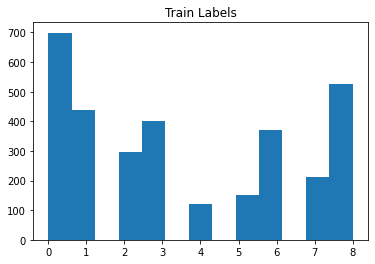

In [ ]:
plt.hist(train_labels, bins='auto') 
plt.title("Train Labels")
plt.show()

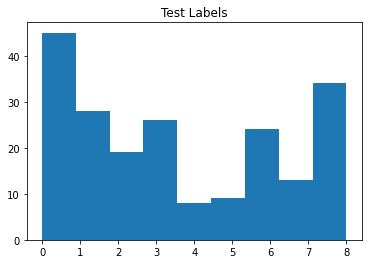

In [ ]:
plt.hist(test_labels, bins='auto') 
plt.title("Test Labels")
plt.show()

# CUSTOM CNN TO DETECT HAIR COLOUR THROUGH CATEGORICAL CLASSIFCATION (softmax)

Model: "model_27"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_27 (InputLayer)        [(None, 128, 128, 3)]     0         
_________________________________________________________________
sequential_40 (Sequential)   (None, 128, 128, 3)       0         
_________________________________________________________________
sequential_41 (Sequential)   (None, 4, 4, 128)         593920    
_________________________________________________________________
flatten_26 (Flatten)         (None, 2048)              0         
_________________________________________________________________
dense_26 (Dense)             (None, 9)                 18441     
Total params: 612,361
Trainable params: 612,361
Non-trainable params: 0
_________________________________________________________________
Epoch 1/20
50/50 [==============================] - 6s 97ms/step - loss: 2.1352 - accuracy: 0.1631 - val_loss: 2.0797 

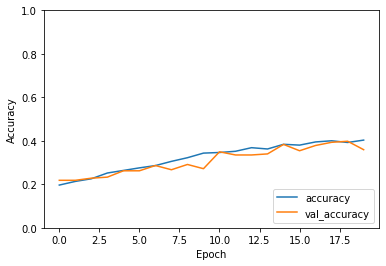

In [ ]:
# Data Augmentation
data_augmentation = keras.Sequential(
    [
        layers.experimental.preprocessing.RandomFlip("horizontal"),
        layers.experimental.preprocessing.RandomRotation(0.1),
        layers.experimental.preprocessing.RandomZoom(0.1),
    ]
)
# the augmentation is being made part of the model. Note that data augmentation is inactive at test time.

# Create a model that includes the augmentation stage
input_shape = (128, 128, 3)


inputs = keras.Input(shape=input_shape)

# Augment images
x = data_augmentation(inputs)

# Add the rest of the model
model = keras.Sequential([
  layers.Conv2D(128, (3, 3), padding = 'SAME', activation='relu', input_shape=(128, 128, 3)),
  layers.MaxPooling2D((2, 2)),
  layers.Conv2D(128, (3, 3), padding = 'SAME', activation='relu'),
  layers.MaxPooling2D((2, 2)),
  layers.Conv2D(128, (3, 3), padding = 'SAME', activation='relu'),
  layers.MaxPooling2D((2, 2)),
  tf.keras.layers.Dropout(0.3),
  layers.Conv2D(128, (3, 3), padding = 'SAME', activation='relu'),
  layers.MaxPooling2D((2, 2)),
  layers.Conv2D(128, (3, 3), padding = 'SAME', activation='relu'),
  layers.MaxPooling2D((2, 2))
])(x)

# add new classifier layers
flat1 = layers.Flatten()(model)
outputs = layers.Dense(9, activation='softmax')(flat1)

# define new model
model = Model(inputs=inputs, outputs= outputs)


model.compile(optimizers.Adam(learning_rate=0.0001),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(),
              metrics=['accuracy'])

model.summary()

# initialize the number of epochs and batch size
EPOCHS = 20
BS = 64


# train the network
history = model.fit(train_images, train_labels, shuffle= True,
	validation_data=(test_images, test_labels), steps_per_epoch=len(train_images) // BS,
	epochs=EPOCHS)

# Save Model
model.save_weights('hair_color_cnn_weights/')
model.save('hair_color_cnn_model/')

# Validation
plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label = 'val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0, 1])
plt.legend(loc='lower right')

In [ ]:
# Evaluations
predictions = model.predict(test_images)
predictions_index = np.argmax(predictions, axis=1)
print(classification_report(test_labels, predictions_index))
matrix = metrics.confusion_matrix(test_labels, predictions_index)
print("CONFUSION MATRIX")
print(matrix)

              precision    recall  f1-score   support

           0       0.35      0.60      0.44        45
           1       0.44      0.39      0.42        28
           2       0.43      0.16      0.23        19
           3       0.41      0.50      0.45        26
           4       0.00      0.00      0.00         8
           5       0.33      0.33      0.33         9
           6       0.40      0.17      0.24        24
           7       0.00      0.00      0.00        13
           8       0.52      0.50      0.51        34

    accuracy                           0.38       206
   macro avg       0.32      0.29      0.29       206
weighted avg       0.37      0.38      0.36       206

CONFUSION MATRIX
[[27  5  0  5  1  1  1  1  4]
 [10 11  0  0  1  1  2  1  2]
 [ 4  3  3  3  0  1  2  2  1]
 [ 5  0  2 13  1  1  0  2  2]
 [ 3  0  0  1  0  1  0  1  2]
 [ 0  0  0  3  0  3  0  0  3]
 [14  2  0  2  0  1  4  0  1]
 [ 8  0  0  4  0  0  0  0  1]
 [ 7  4  2  1  0  0  1  2 17]]


## CHECKING MODEL PREDICTIONS

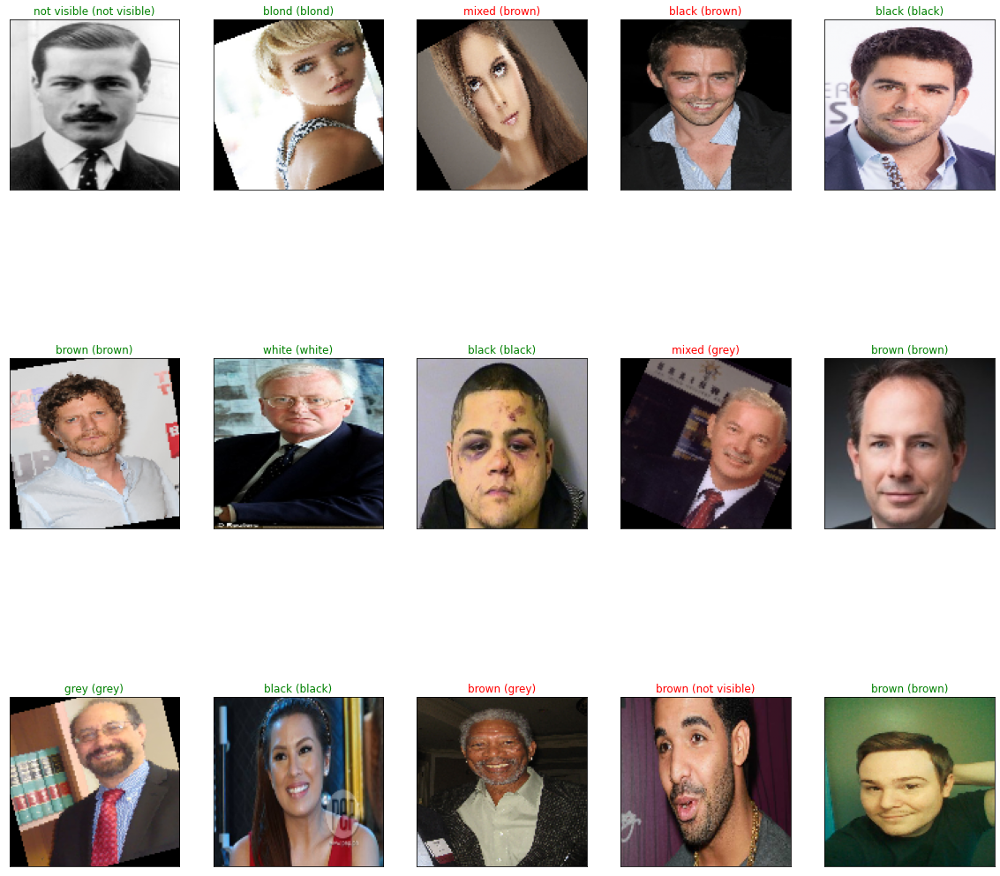

In [ ]:
import pdb
y_hat = model.predict(test_images)

# Plot a random sample of 15 test images, their predicted labels and ground truth
figure = plt.figure(figsize=(20, 20))
for i, index in enumerate(np.random.choice(test_images.shape[0], size=15, replace=False)):
    ax = figure.add_subplot(3, 5, i + 1, xticks=[], yticks=[])
    # Display each image
    ax.imshow(np.squeeze(test_images[index]))
    predict_index = np.argmax(y_hat[index])
    true_index = test_labels[index]
    # Set the title for each image
    ax.set_title("{} ({})".format(class_names[predict_index], 
                                  class_names[true_index]),
                                  color=("green" if predict_index == true_index else "red"))

# TESTING RESNET-50 ON HAIR COLOR

Epoch 1/10
13/13 [==============================] - 22s 1s/step - loss: 2.7314 - accuracy: 0.2864 - val_loss: 2.2761 - val_accuracy: 0.1553
Epoch 2/10
13/13 [==============================] - 11s 842ms/step - loss: 0.0948 - accuracy: 0.9833 - val_loss: 2.3884 - val_accuracy: 0.1165
Epoch 3/10
13/13 [==============================] - 11s 822ms/step - loss: 0.0126 - accuracy: 1.0000 - val_loss: 2.2807 - val_accuracy: 0.1311
Epoch 4/10
13/13 [==============================] - 11s 812ms/step - loss: 0.0054 - accuracy: 1.0000 - val_loss: 2.2463 - val_accuracy: 0.1650
Epoch 5/10
13/13 [==============================] - 10s 806ms/step - loss: 0.0032 - accuracy: 1.0000 - val_loss: 2.3318 - val_accuracy: 0.1505
Epoch 6/10
13/13 [==============================] - 11s 812ms/step - loss: 0.0025 - accuracy: 1.0000 - val_loss: 2.4036 - val_accuracy: 0.1456
Epoch 7/10
13/13 [==============================] - 11s 817ms/step - loss: 0.0019 - accuracy: 1.0000 - val_loss: 2.4472 - val_accuracy: 0.1553
Ep

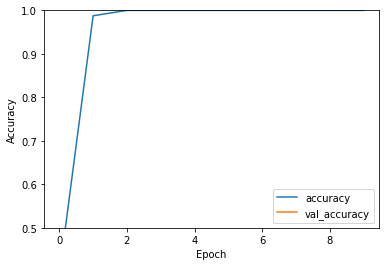

In [ ]:
from keras.applications.resnet50 import ResNet50
from keras.models import Model

# load model without classifier layers
model = ResNet50(include_top=False, weights="imagenet", input_shape=(128, 128, 3)) 
    

# add new classifier layers
flat1 = layers.Flatten()(model.layers[-1].output)
output = layers.Dense(9, activation='softmax')(flat1)


# define new model
model = Model(inputs=model.inputs, outputs=output)

model.compile(optimizers.Adam(learning_rate=0.0001),
              loss=tf.keras.losses.SparseCategoricalCrossentropy(),
              metrics=['accuracy'])

# Training
history = model.fit(train_images, train_labels, epochs=10, batch_size=256,
                    validation_data=(test_images, test_labels))

# Validation
plt.plot(history.history['accuracy'], label='accuracy')
plt.plot(history.history['val_accuracy'], label = 'val_accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.ylim([0.5, 1])
plt.legend(loc='lower right')

test_loss, test_acc = model.evaluate(test_images,  test_labels, verbose=2)

print(test_acc)

In [ ]:
# Evaluations
predictions = model.predict(test_images)
predictions_index = np.argmax(predictions, axis=1)
print(classification_report(test_labels, predictions_index))
matrix = metrics.confusion_matrix(test_labels, predictions_index)
print("CONFUSION MATRIX")
print(matrix)

              precision    recall  f1-score   support

           0       0.12      0.02      0.04        45
           1       0.25      0.14      0.18        28
           2       0.00      0.00      0.00        19
           3       0.17      0.12      0.14        26
           4       0.00      0.00      0.00         8
           5       0.00      0.00      0.00         9
           6       0.00      0.00      0.00        24
           7       0.00      0.00      0.00        13
           8       0.17      0.82      0.28        34

    accuracy                           0.17       206
   macro avg       0.08      0.12      0.07       206
weighted avg       0.11      0.17      0.10       206

CONFUSION MATRIX
[[ 1  3  0  4  0  0  0  0 37]
 [ 3  4  0  1  0  0  0  0 20]
 [ 0  4  0  3  0  0  0  0 12]
 [ 1  1  0  3  0  0  0  0 21]
 [ 0  0  0  0  0  0  0  0  8]
 [ 1  0  0  0  0  0  0  0  8]
 [ 1  0  0  0  0  0  0  0 23]
 [ 0  2  0  4  0  0  0  0  7]
 [ 1  2  0  3  0  0  0  0 28]]


#### RESNET had a very bad accuracy compared to custom CNN